<a href="https://colab.research.google.com/github/ggzone/Modern-Computer-Vision-with-PyTorch/blob/master/Chapter10/Multi_object_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
!pip install -qU openimages torch_snippets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 7.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.7/84.7 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.6/61.6 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 218.7/218.7 kB 20.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.6/162.6 kB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 103.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.0/99.0 kB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.2/83.2 kB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 95.0 MB/s eta 0:00:00
   ━━

In [ ]:
# from torch_snippets import *
# !wget -O train-annotations-object-segmentation.csv -q https://storage.googleapis.com/openimages/v5/train-annotations-object-segmentation.csv
# !wget -O classes.csv -q https://raw.githubusercontent.com/openimages/dataset/master/dict.csv

#Invoke-WebRequest https://raw.githubusercontent.com/openimages/dataset/master/dict.csv  -OutFile .\Chapter10\dict.csv

In [ ]:
from torch_snippets import *

In [ ]:
required_classes = 'person,dog,bird,car,elephant,football,jug,laptop,Mushroom,Pizza,Rocket,Shirt,Traffic sign,Watermelon,Zebra'
required_classes = [c.lower() for c in required_classes.lower().split(',')]

classes = pd.read_csv('classes.csv', header=None)
classes.columns = ['class','class_name']
classes = classes[classes['class_name'].map(lambda x: x in required_classes)]

In [ ]:
from torch_snippets import *
df = pd.read_csv('train-annotations-object-segmentation.csv')
df.head()

data = pd.merge(df, classes, left_on='LabelName', right_on='class')

subset_data = data.groupby('class_name').agg({'ImageID': lambda x: list(x)[:500]})
subset_data = flatten(subset_data.ImageID.tolist())
subset_data = data[data['ImageID'].map(lambda x: x in subset_data)]
subset_masks = subset_data['MaskPath'].tolist()

In [ ]:
import os
import requests
import zipfile
import shutil


# Create a directory for masks
os.makedirs('masks', exist_ok=True)


#覆盖torch_snippets中的fname函数，其只支持linux
def fname(path):
    return os.path.basename(path)

# Iterate through the characters to download and process mask files
for c in Tqdm('0123456789abcdef'):

    # Download the zip file
    # url = f"https://storage.googleapis.com/openimages/v5/train-masks/train-masks-{c}.zip"
    # response = requests.get(url)
    # with open(f'train-masks-{c}.zip', 'wb') as f:
    #     f.write(response.content)

    #Unzip the downloaded file
    with zipfile.ZipFile(f'train-masks-{c}.zip', 'r') as zip_ref:
        zip_ref.extractall('tmp_masks')

    # Remove the zip file
    #os.remove(f'train-masks-{c}.zip')

    # Process the extracted masks
    tmp_masks = Glob('tmp_masks', silent=True)

    items = [(m, fname(m)) for m in tmp_masks]
    #print(items[:20])
    items = [(i, j) for (i, j) in items if j in subset_masks]
    #print(items[:20])

    # Move the relevant masks to the masks directory
    for i, j in items:
        os.rename(i, f'masks/{j}')

    #Remove the temporary masks directory
    shutil.rmtree('tmp_masks')

100%|███████████████████████████████████████████████████████████████| 16/16 [1:02:00<00:00, 232.52s/it]


In [ ]:
subset_data.describe()

,BoxXMin,BoxXMax,BoxYMin,BoxYMax,PredictedIoU
count,14090.000000,14090.000000,14090.000000,14090.000000,14090.000000
mean,0.371415,0.625819,0.367082,0.698071,0.811708
std,0.252840,0.255076,0.226014,0.230226,0.109455
min,0.000000,0.025625,0.000000,0.039375,0.000000
25%,0.158750,0.437500,0.188893,0.531719,0.766800
50%,0.359375,0.636754,0.361667,0.729054,0.839085
75%,0.557500,0.844375,0.524473,0.893876,0.885773
max,0.974375,1.000000,0.962500,1.000000,0.953390


In [ ]:
# !mkdir -p masks
# for c in Tqdm('0123456789abcdef'):
#     !wget -q https://storage.googleapis.com/openimages/v5/train-masks/train-masks-{c}.zip
#     !unzip -q train-masks-{c}.zip -d tmp_masks
#     !rm train-masks-{c}.zip
#     tmp_masks = Glob('tmp_masks', silent=True)
#     items = [(m,fname(m)) for m in tmp_masks]
#     items = [(i,j) for (i,j) in items if j in subset_masks]
#     for i,j in items:
#         os.rename(i, f'masks/{j}')
#     !rm -rf tmp_masks

In [ ]:
masks = Glob('masks')
masks = [fname(mask) for mask in masks]

subset_data = subset_data[subset_data['MaskPath'].map(lambda x: x in masks)]
subset_imageIds = subset_data['ImageID'].tolist()

from openimages.download import _download_images_by_id
#!mkdir images

import os
os.makedirs('images', exist_ok=True)
_download_images_by_id(subset_imageIds, 'train', './images/')

100%|████████████████████████████████████████████████████████████| 14090/14090 [34:29<00:00,  6.81it/s]


In [ ]:
import zipfile
files = Glob('images') + Glob('masks') + ['train-annotations-object-segmentation.csv', 'classes.csv']
with zipfile.ZipFile('data.zip','w') as zipme:
    for file in Tqdm(files):
        zipme.write(file, compress_type=zipfile.ZIP_DEFLATED)

100%|████████████████████████████████████████████████████████████| 20005/20005 [04:31<00:00, 73.56it/s]


In [ ]:
# !mkdir -p train/
# !mv images train/myData2020
# !mv masks train/annotations

# Create directories and move files using Python
import os
import shutil

os.makedirs('train', exist_ok=True)
shutil.move('images', 'train/myData2020')
shutil.move('masks', 'train/annotations')

'train/annotations'

In [ ]:
!pip install git+git://github.com/waspinator/pycococreator.git@0.2.0
import datetime

INFO = {
    "description": "MyData2020",
    "url": "None",
    "version": "1.0",
    "year": 2020,
    "contributor": "sizhky",
    "date_created": datetime.datetime.utcnow().isoformat(' ')
}

LICENSES = [
    {
        "id": 1,
        "name": "MIT"
    }
]

CATEGORIES = [{'id': id+1, 'name': name.replace('/',''), 'supercategory': 'none'} for id,(_,(name, clss_name)) in enumerate(classes.iterrows())]

In [ ]:
#!pip install git+https://github.com/waspinator/pycococreator.git@0.2.0
#需要修改代码
#pycococreatortools/pycococreatortools.py
#Fix bug in binary_mask_to_polygon when multiple disjoint contours are found #51
!pip install D:\\open-source\\pycococreator

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
Processing d:\open-source\pycococreator
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for pycococreatortools: filename=pycococreatortools-0.2.0-py3-none-any.whl size=7224 sha256=73561c29019410a300cc747f6552060a0aa0b86d18e6f4c97539ca209a92ba9e
  Stored in directory: C:\Users\hunter\AppData\Local\Temp\pip-ephem-wheel-cache-9h4gjekr\wheels\4f\70\40\beac91b9dcaae2149c157f57ef1891d1dc5eff0d4abd77d29d
Successfully built pycococreatortools


In [ ]:
#!pip install pycocotools

from os import listdir
from os.path import isfile, join
from PIL import Image

coco_output = {
    "info": INFO,
    "licenses": LICENSES,
    "categories": CATEGORIES,
    "images": [],
    "annotations": []
}

coco_output

{'info': {'description': 'MyData2020',
  'url': 'None',
  'version': '1.0',
  'year': 2020,
  'contributor': 'sizhky',
  'date_created': '2024-12-29 02:48:13.662309'},
 'licenses': [{'id': 1, 'name': 'MIT'}],
 'categories': [{'id': 1, 'name': 'm01226z', 'supercategory': 'none'},
  {'id': 2, 'name': 'm015p6', 'supercategory': 'none'},
  {'id': 3, 'name': 'm01c648', 'supercategory': 'none'},
  {'id': 4, 'name': 'm01g317', 'supercategory': 'none'},
  {'id': 5, 'name': 'm01mqdt', 'supercategory': 'none'},
  {'id': 6, 'name': 'm01n4qj', 'supercategory': 'none'},
  {'id': 7, 'name': 'm02vx4', 'supercategory': 'none'},
  {'id': 8, 'name': 'm052sf', 'supercategory': 'none'},
  {'id': 9, 'name': 'm0663v', 'supercategory': 'none'},
  {'id': 10, 'name': 'm0898b', 'supercategory': 'none'},
  {'id': 11, 'name': 'm08hvt4', 'supercategory': 'none'},
  {'id': 12, 'name': 'm09rvcxw', 'supercategory': 'none'},
  {'id': 13, 'name': 'm0bt9lr', 'supercategory': 'none'},
  {'id': 14, 'name': 'm0bwd_0j', 'su

In [ ]:
ROOT_DIR = "train"
IMAGE_DIR, ANNOTATION_DIR = 'train/myData2020/', 'train/annotations/'

image_files = [f for f in listdir(IMAGE_DIR) if os.path.isfile(os.path.join(IMAGE_DIR, f))]
annotation_files = [f for f in listdir(ANNOTATION_DIR) if os.path.isfile(os.path.join(ANNOTATION_DIR, f))]

In [ ]:
from pycococreatortools import pycococreatortools
image_id = 1
# go through each image
for image_filename in Tqdm(image_files):
    image = Image.open(IMAGE_DIR + '/' + image_filename)
    image_info = pycococreatortools.create_image_info(image_id, os.path.basename(image_filename), image.size)
    coco_output["images"].append(image_info)
    image_id = image_id + 1

100%|█████████████████████████████████████████████████████████████| 5913/5913 [00:29<00:00, 202.66it/s]


In [ ]:
annotation_files=annotation_files[:10]

['000033469fb48bc1_m01n4qj_378b9f3a.png',
 '000033469fb48bc1_m01n4qj_6ff14b4c.png',
 '000033469fb48bc1_m01n4qj_d9532ad5.png',
 '000033469fb48bc1_m01n4qj_e8852296.png',
 '0000a16e4b057580_m0kpqd_373179ea.png',
 '0000a16e4b057580_m0kpqd_bbb423f3.png',
 '0000a16e4b057580_m0kpqd_e190893d.png',
 '0000a16e4b057580_m0kpqd_f6dad93e.png',
 '000256419f7c57d8_m01g317_01bc0dc4.png',
 '000256419f7c57d8_m01g317_28f4a524.png']

In [ ]:
import importlib
importlib.reload(pycococreatortools)
from pycococreatortools import pycococreatortools

segmentation_id = 1
for annotation_filename in Tqdm(annotation_files):
    image_id = [f for f in coco_output['images'] if stem(f['file_name'])==annotation_filename.split('_')[0]][0]['id']
    class_id = [x['id'] for x in CATEGORIES if x['name'] in annotation_filename][0]
    category_info = {'id': class_id, 'is_crowd': 'crowd' in image_filename}
    binary_mask = np.asarray(Image.open(f'{ANNOTATION_DIR}/{annotation_filename}').convert('1')).astype(np.uint8)
    #print(f'binary_mask shape: {binary_mask.shape}')
    #print(f'binary_mask unique values: {np.unique(binary_mask)}')

    #print(f'image_id:{image_id},class_id:{class_id},category_info:{category_info},binary_mask:{binary_mask}')

    annotation_info = pycococreatortools.create_annotation_info(segmentation_id, image_id, category_info, binary_mask, image.size, tolerance=2)
    #print(annotation_info)

    if annotation_info is not None:
        coco_output["annotations"].append(annotation_info)
        segmentation_id = segmentation_id + 1

100%|████████████████████████████████████████████████████████████| 14090/14090 [16:25<00:00, 14.29it/s]


In [ ]:
coco_output['categories'] = [{'id': id+1, 'name': clss_name, 'supercategory': 'none'} for id,(_,(name, clss_name)) in enumerate(classes.iterrows())]

import json
with open('images.json', 'w') as output_json_file:
    json.dump(coco_output, output_json_file)

In [ ]:
import json

#修改源码后images.json中Annotation中元素的id会产生重复，造成detectron2报错：AssertionError: Annotation ids in 'images.json' are not unique

# 加载 JSON 文件
with open("images.json", "r") as f:
    data = json.load(f)

# 获取 annotations
annotations = data.get("annotations", [])

# 重新生成唯一的 ID
for idx, annotation in enumerate(annotations):
    annotation["id"] = idx + 1

# 保存修复后的 JSON 文件
with open("images_fixed.json", "w") as f:
    json.dump(data, f)


In [7]:
#!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html
#!pip install pycocotools>=2.0.1
!pip install git+https://github.com/facebookresearch/detectron2.git
#!pip install D:\\open-source\\detectron2

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-cq6b6k3u
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-cq6b6k3u
  Resolved https://github.com/facebookresearch/detectron2.git to commit b1c43ffbc995426a9a6b5c667730091a384e0fa4
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 5.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.2/79.2 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 13.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 15.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 84.1 MB/s eta 0:00:00
  Created wheel for detectron2: filename=detectron2-0.6-cp3

In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
#解压/content/drive/MyDrive/mcvp-packt/Chapter10/chapter10.zip文件到/content/目录
!unzip "/content/drive/MyDrive/mcvp-packt/Chapter10/chapter10.zip" -d "/content/"

In [1]:
from torch_snippets import *
required_classes = 'person,dog,bird,car,elephant,football,jug,laptop,Mushroom,Pizza,Rocket,Shirt,Traffic sign,Watermelon,Zebra'
required_classes = [c.lower() for c in required_classes.lower().split(',')]

classes = pd.read_csv('classes.csv', header=None)
classes.columns = ['class','class_name']
classes = classes[classes['class_name'].map(lambda x: x in required_classes)]

In [3]:
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.engine import DefaultTrainer

In [4]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("dataset_train", {}, "images.json", "train/myData2020")

In [5]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml") # pretrained weights
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025 # pick a good LR
cfg.SOLVER.MAX_ITER = 5000 # instead of epochs, we train on 5000 batches
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(classes)
#cfg.MODEL.DEVICE="cpu"   #没有GPU情况下配置

In [6]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[12/29 07:00:50 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:01, 121MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[12/29 07:00:54 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[12/29 07:01:07 d2.utils.events]:  eta: 0:37:11  iter: 19  total_loss: 3.6  loss_cls: 2.702  loss_box_reg: 0.09533  loss_mask: 0.6931  loss_rpn_cls: 0.05661  loss_rpn_loc: 0.01442    time: 0.4584  last_time: 0.5927  data_time: 0.0267  last_data_time: 0.0191   lr: 4.9953e-06  max_mem: 2490M
[12/29 07:01:20 d2.utils.events]:  eta: 0:36:39  iter: 39  total_loss: 3.522  loss_cls: 2.59  loss_box_reg: 0.09395  loss_mask: 0.6928  loss_rpn_cls: 0.06972  loss_rpn_loc: 0.01918    time: 0.4542  last_time: 0.4099  data_time: 0.0098  last_data_time: 0.0056   lr: 9.9902e-06  max_mem: 2512M
[12/29 07:01:29 d2.utils.events]:  eta: 0:37:18  iter: 59  total_loss: 3.157  loss_cls: 2.265  loss_box_reg: 0.09637  loss_mask: 0.6927  loss_rpn_cls: 0.07056  loss_rpn_loc: 0.01398    time: 0.4566  last_time: 0.3737  data_time: 0.0119  last_data_time: 0.0033   lr: 1.4985e-05  max_mem: 2512M
[12/29 07:01:38 d2.utils.events]:  eta: 0:37:51  iter: 79  total_loss: 2.991  loss_cls: 1.861  loss_box_reg: 0.08507  loss_m

In [11]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding
!cp output/model_final.pth output/trained_model.pth

[12/29 07:49:34 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/trained_model.pth ...


/usr/local/lib/python3.10/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

[12/29/24 07:49:34] INFO     Chose `train/myData2020/545bdccca92ad23e.jpg` from input                                                                   ]8;id=688305;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=927060;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

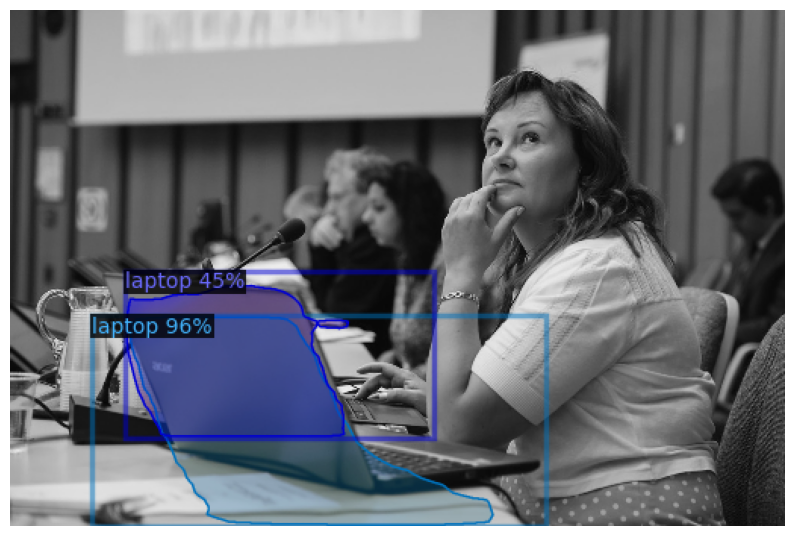

[12/29/24 07:49:35] INFO     Chose `train/myData2020/14ef028afde42a2f.jpg` from input                                                                   ]8;id=378131;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=954980;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

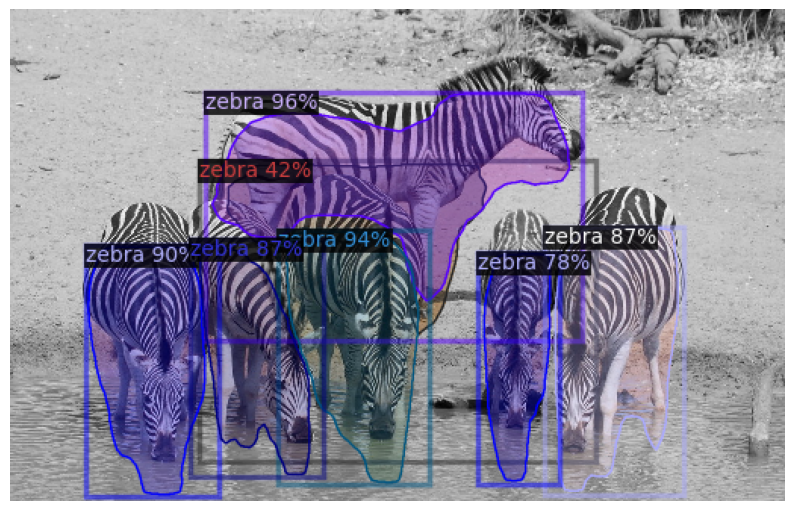

[12/29/24 07:49:36] INFO     Chose `train/myData2020/3e7dcac42c0ae2a1.jpg` from input                                                                   ]8;id=609892;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=333574;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

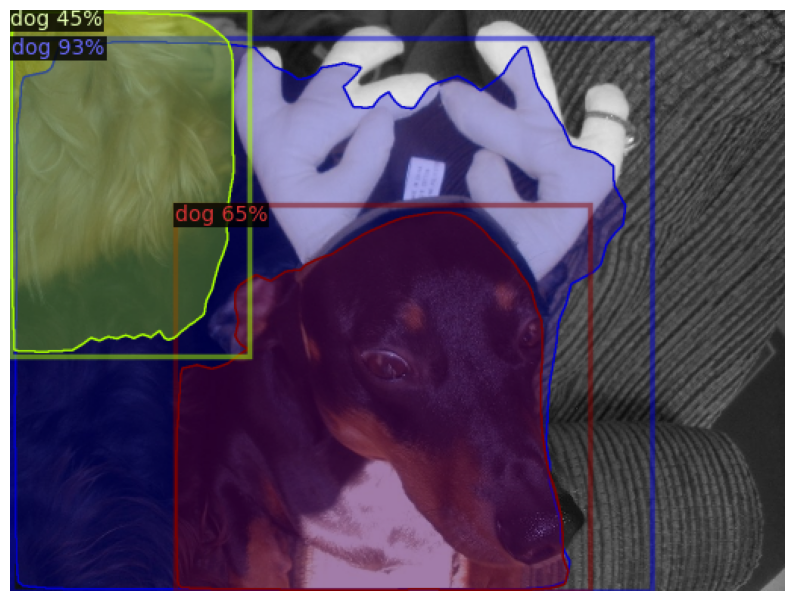

[12/29/24 07:49:38] INFO     Chose `train/myData2020/1302c74b9df205b8.jpg` from input                                                                   ]8;id=553149;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=828166;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

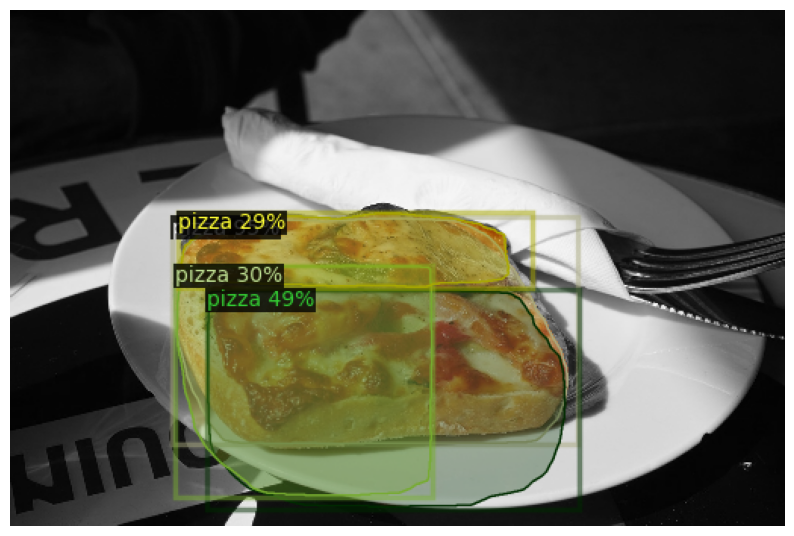

                    INFO     Chose `train/myData2020/594ececcc82e9e09.jpg` from input                                                                   ]8;id=681051;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=842241;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

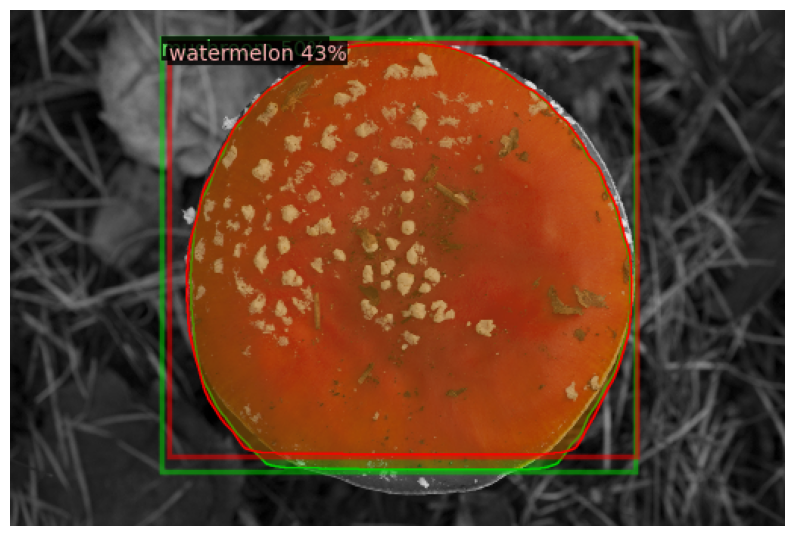

[12/29/24 07:49:39] INFO     Chose `train/myData2020/00ac21346de661cb.jpg` from input                                                                   ]8;id=729542;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=65752;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

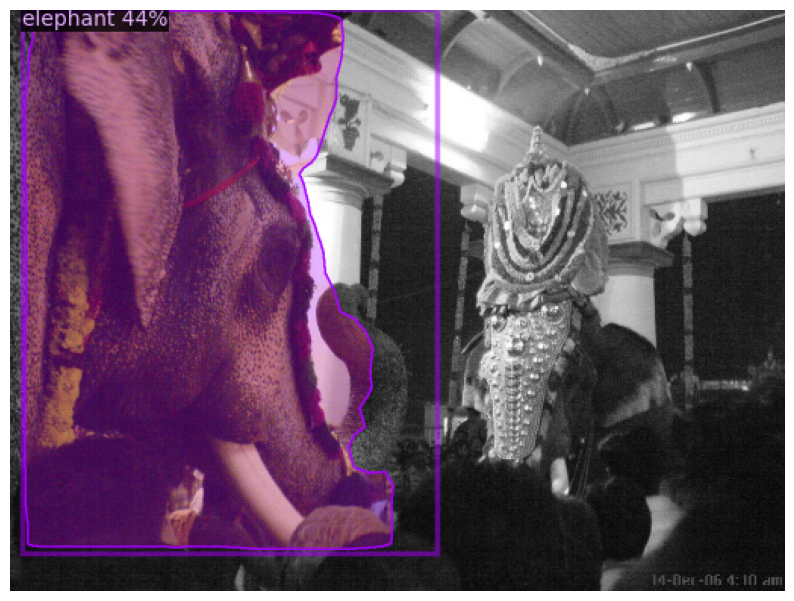

                    INFO     Chose `train/myData2020/0cdd2ef7ba7ffeff.jpg` from input                                                                   ]8;id=390036;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=17630;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

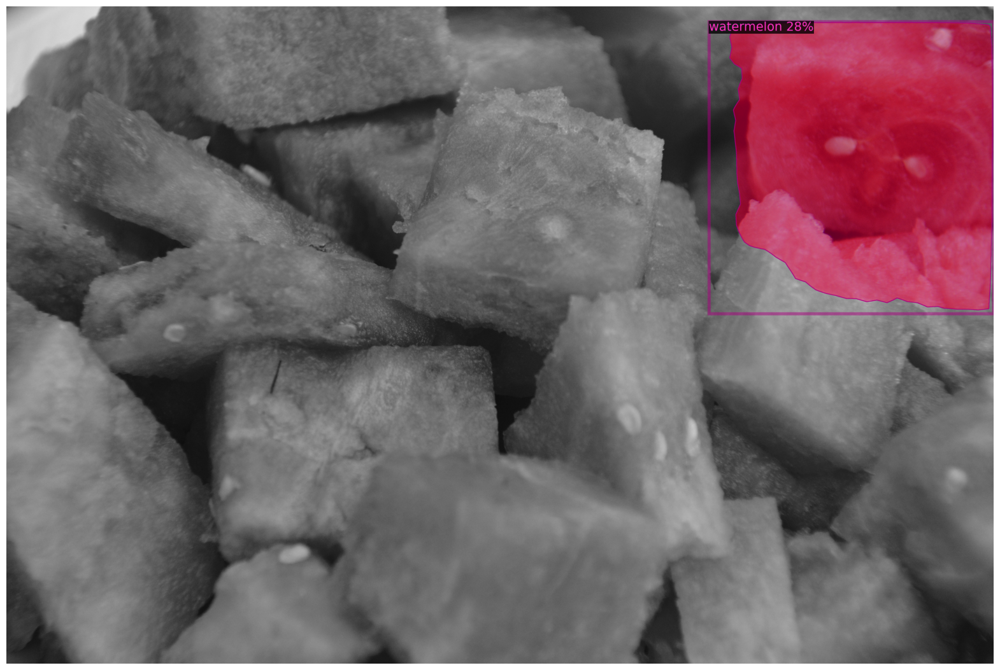

[12/29/24 07:49:45] INFO     Chose `train/myData2020/545bdccca92ad23e.jpg` from input                                                                   ]8;id=830017;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=346842;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

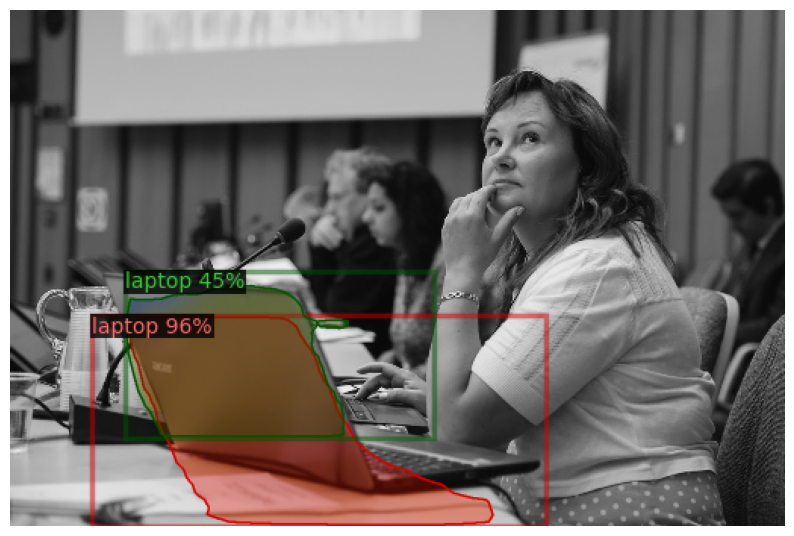

[12/29/24 07:49:46] INFO     Chose `train/myData2020/dc1c4bf96d2b2593.jpg` from input                                                                   ]8;id=182162;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=223725;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

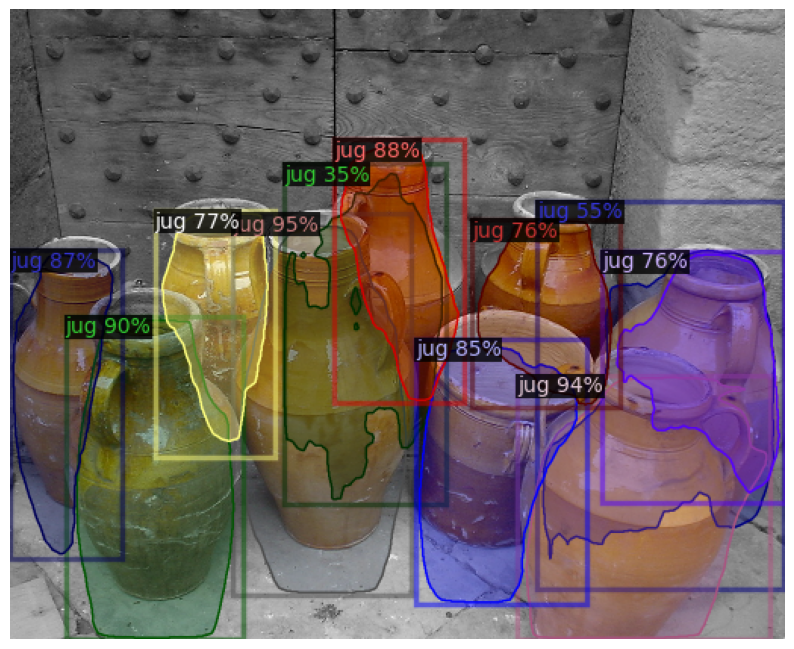

[12/29/24 07:49:47] INFO     Chose `train/myData2020/12f270452effb284.jpg` from input                                                                   ]8;id=469421;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=525650;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

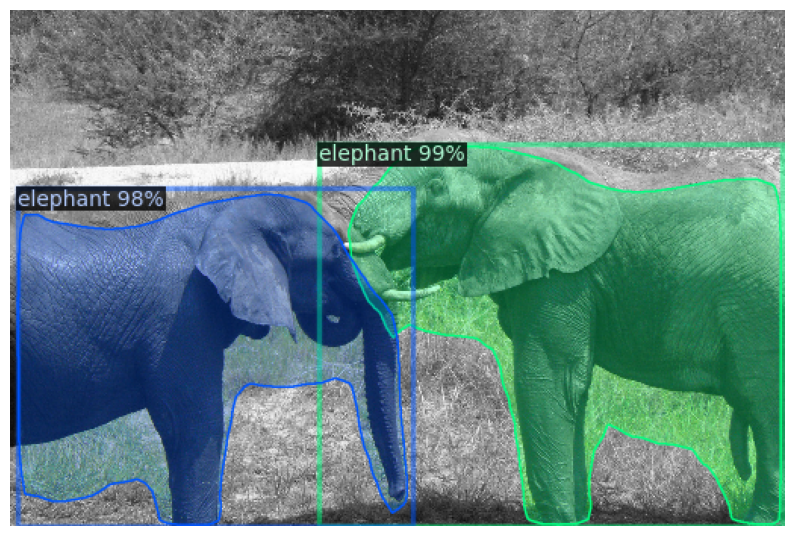

[12/29/24 07:49:48] INFO     Chose `train/myData2020/434757e25c331042.jpg` from input                                                                   ]8;id=670199;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=227353;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

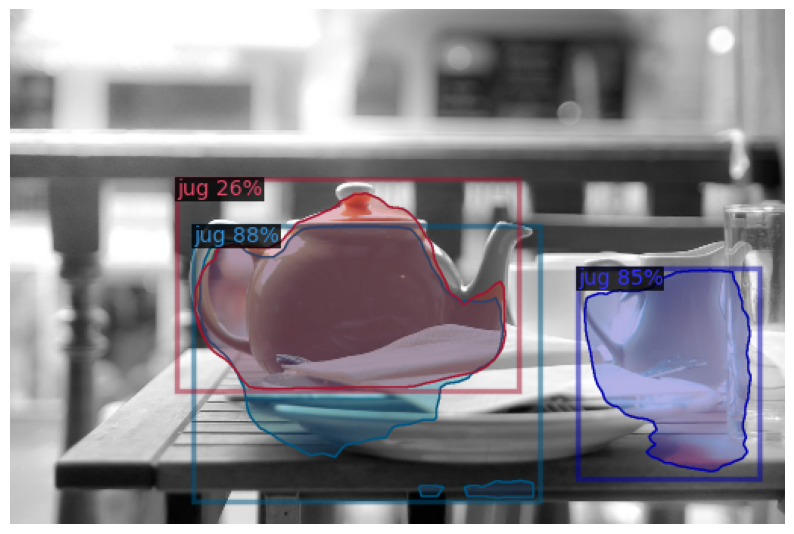

[12/29/24 07:49:49] INFO     Chose `train/myData2020/5dd795b4f29d1ac9.jpg` from input                                                                   ]8;id=581560;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=23274;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

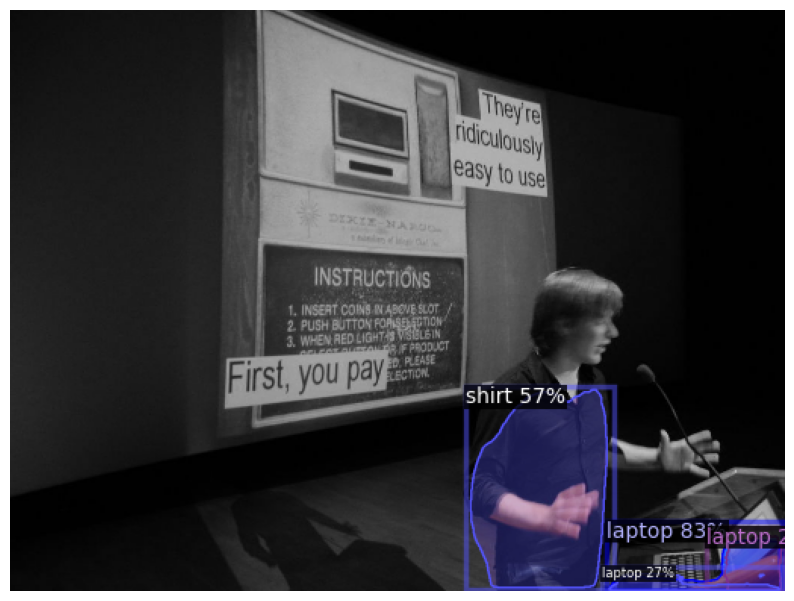

[12/29/24 07:49:50] INFO     Chose `train/myData2020/1ca1389cddaab1b6.jpg` from input                                                                   ]8;id=413551;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=941138;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

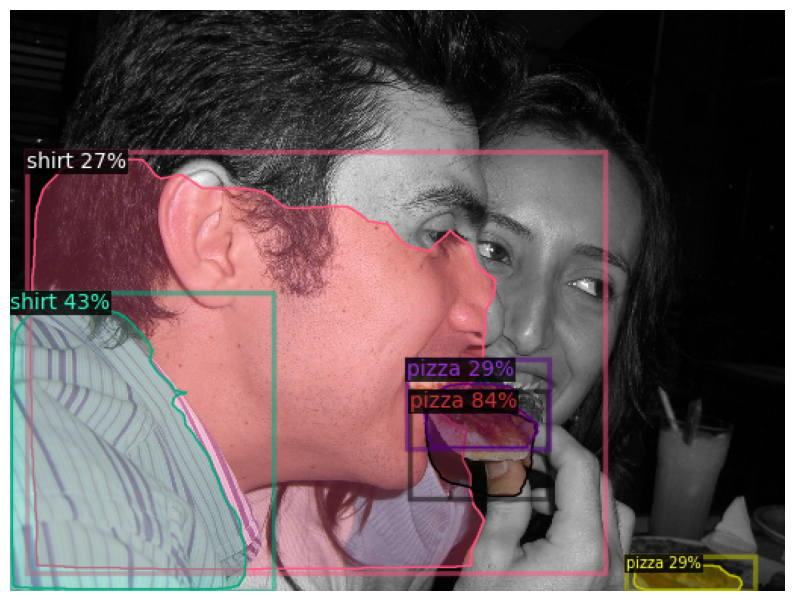

[12/29/24 07:49:51] INFO     Chose `train/myData2020/387572ff3afdf6d7.jpg` from input                                                                   ]8;id=424467;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=231266;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

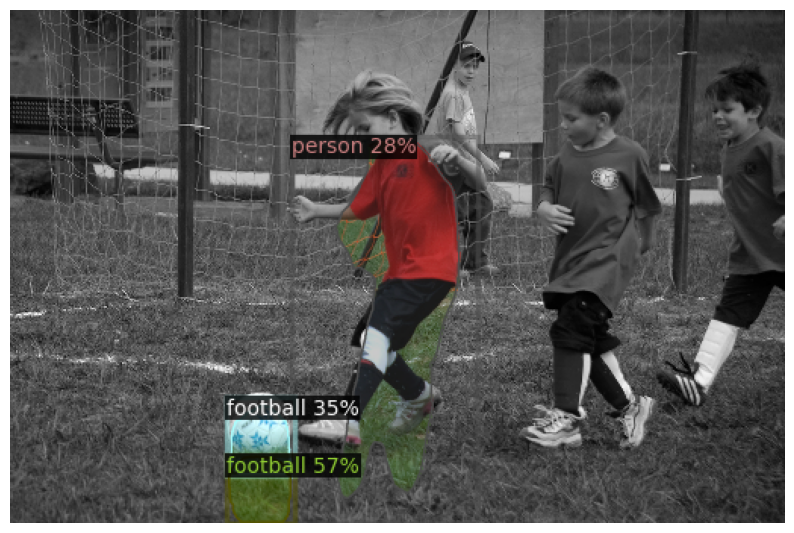

                    INFO     Chose `train/myData2020/1c7a2806fb37a96c.jpg` from input                                                                   ]8;id=916615;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=700838;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

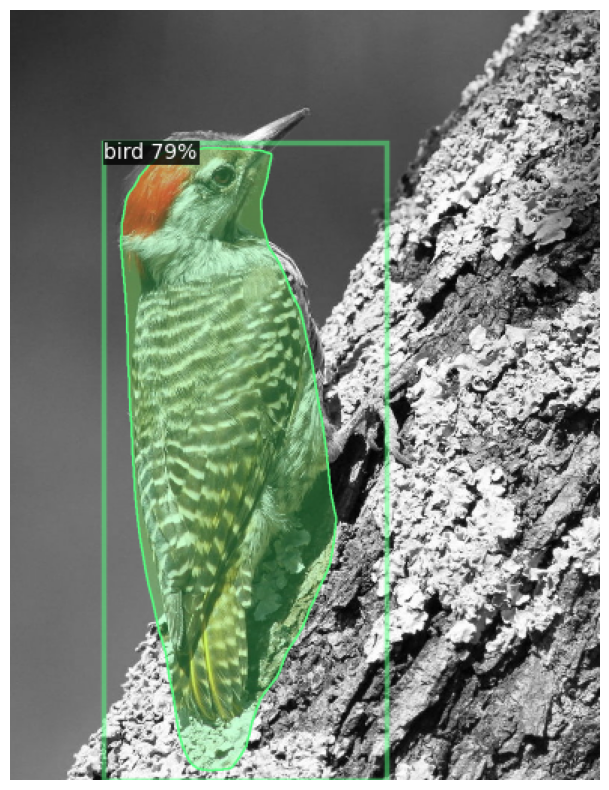

[12/29/24 07:49:52] INFO     Chose `train/myData2020/de4440ed120cc6d9.jpg` from input                                                                   ]8;id=679883;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=53222;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

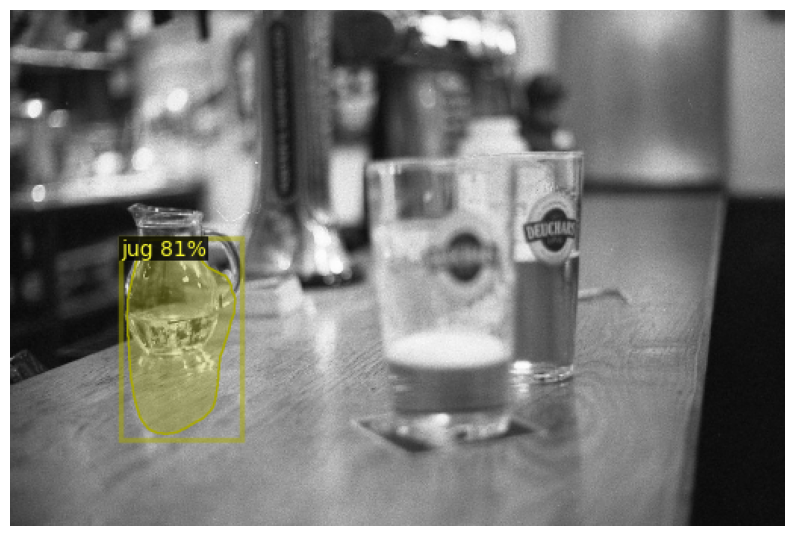

[12/29/24 07:49:53] INFO     Chose `train/myData2020/7cf1b287416fc089.jpg` from input                                                                   ]8;id=396102;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=256759;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

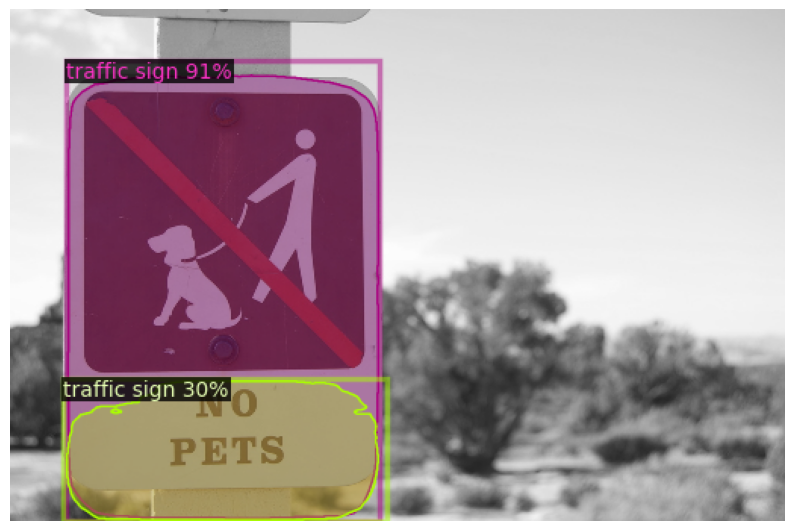

[12/29/24 07:49:54] INFO     Chose `train/myData2020/ac7720fc62ede102.jpg` from input                                                                   ]8;id=222620;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=822092;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

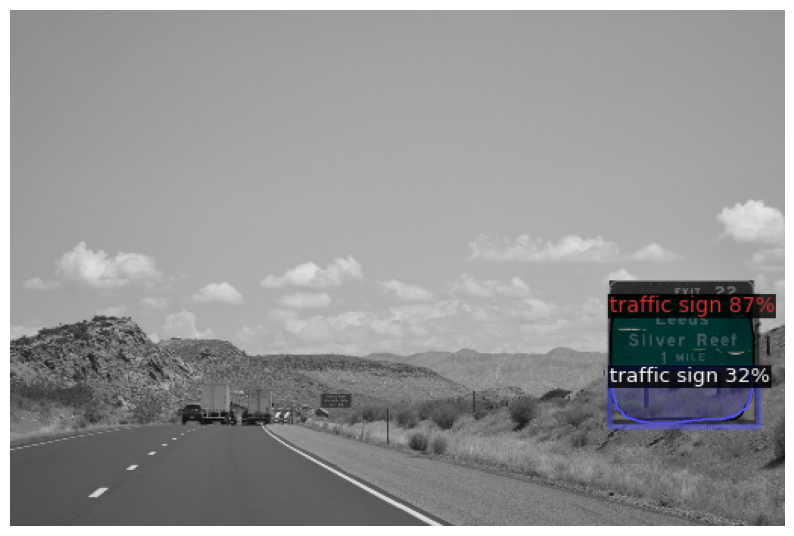

[12/29/24 07:49:55] INFO     Chose `train/myData2020/ddf67625fc6a1143.jpg` from input                                                                   ]8;id=31728;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=739683;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

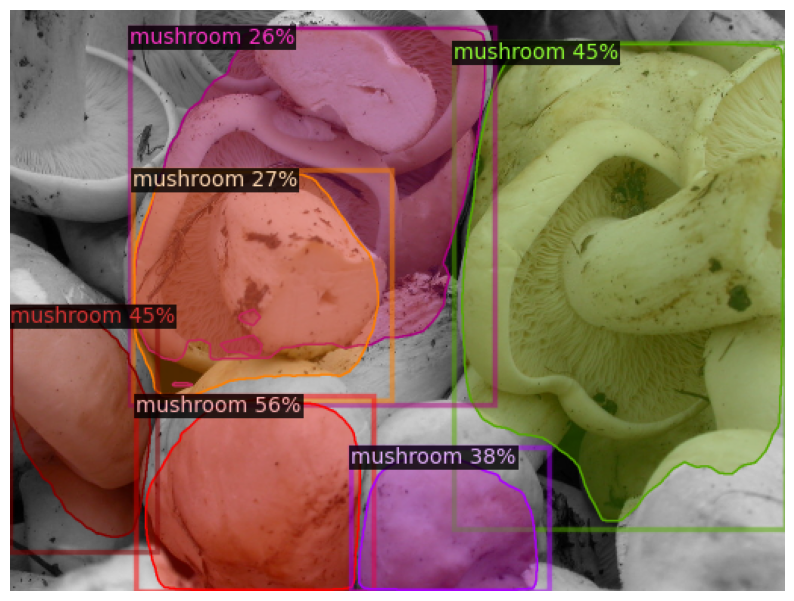

[12/29/24 07:49:56] INFO     Chose `train/myData2020/f035f34424a53efd.jpg` from input                                                                   ]8;id=192152;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=835837;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

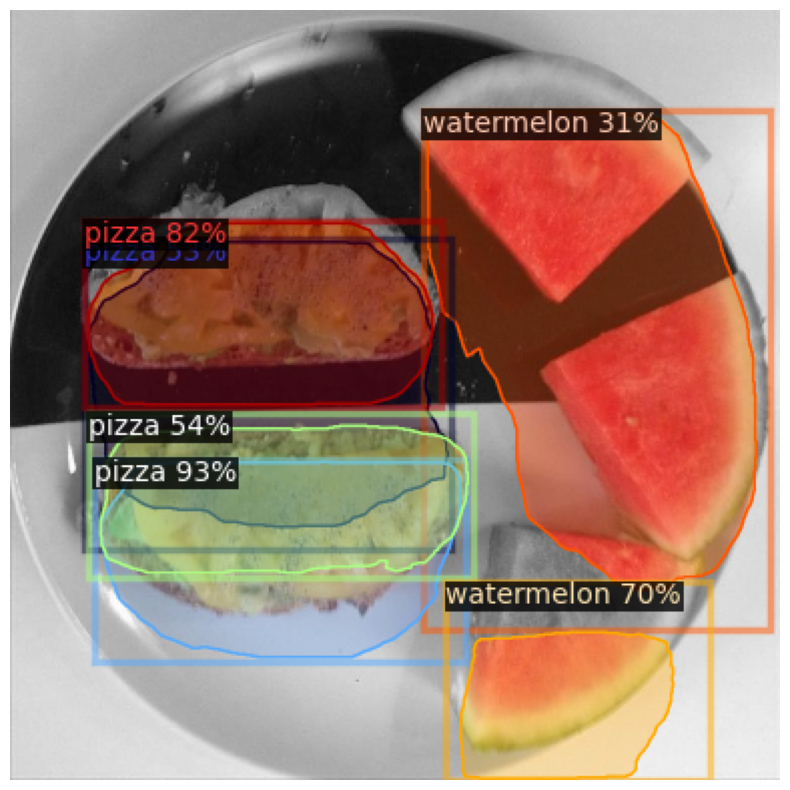

[12/29/24 07:49:57] INFO     Chose `train/myData2020/cf1084737c2dc779.jpg` from input                                                                   ]8;id=291539;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=838039;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

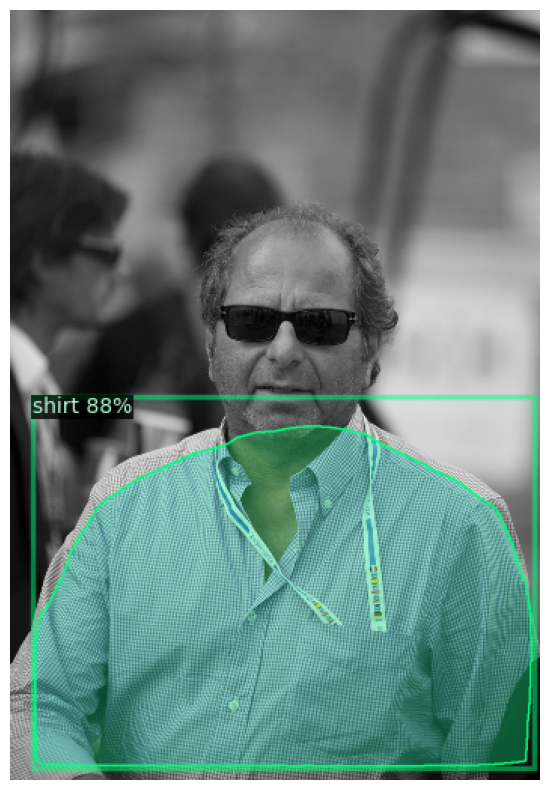

[12/29/24 07:49:58] INFO     Chose `train/myData2020/48f58cea64a49baf.jpg` from input                                                                   ]8;id=456918;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=450733;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

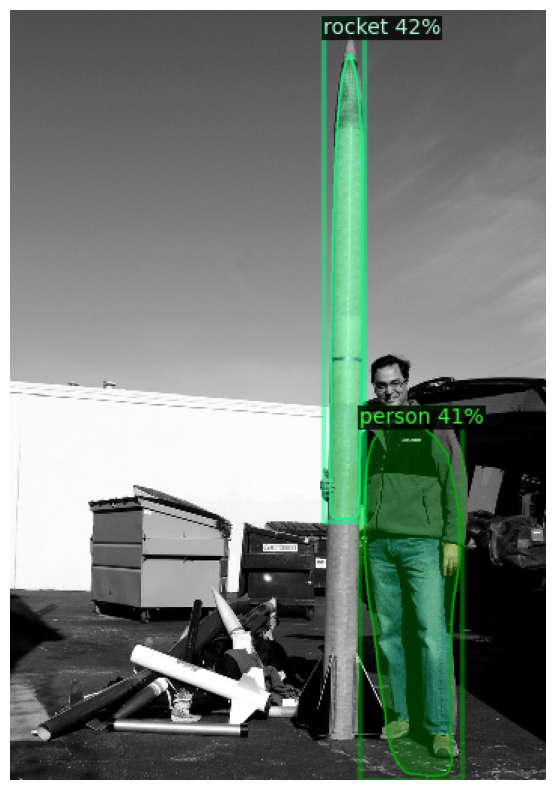

[12/29/24 07:49:59] INFO     Chose `train/myData2020/283b9bf7295afbbc.jpg` from input                                                                   ]8;id=622331;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=865732;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

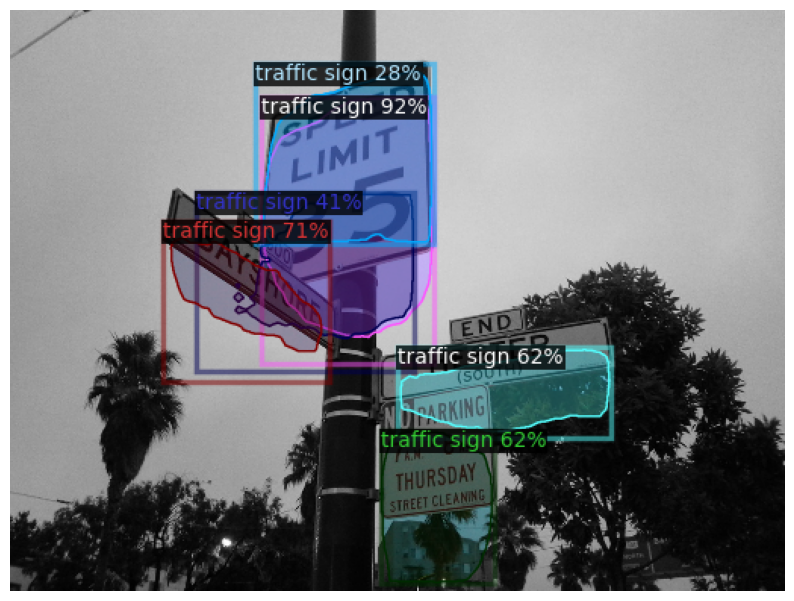

[12/29/24 07:50:00] INFO     Chose `train/myData2020/06d0b22425575487.jpg` from input                                                                   ]8;id=671129;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=677639;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

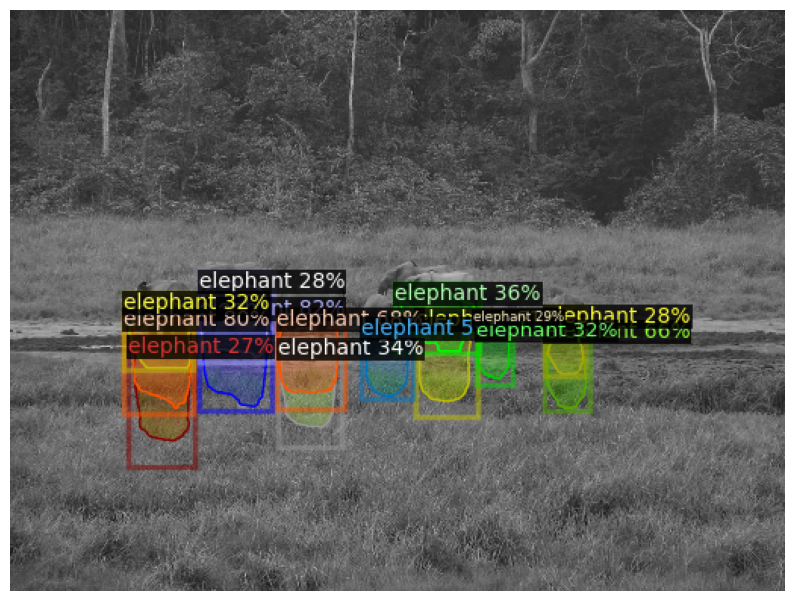

                    INFO     Chose `train/myData2020/930c817d43dd47d7.jpg` from input                                                                   ]8;id=227523;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=938805;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

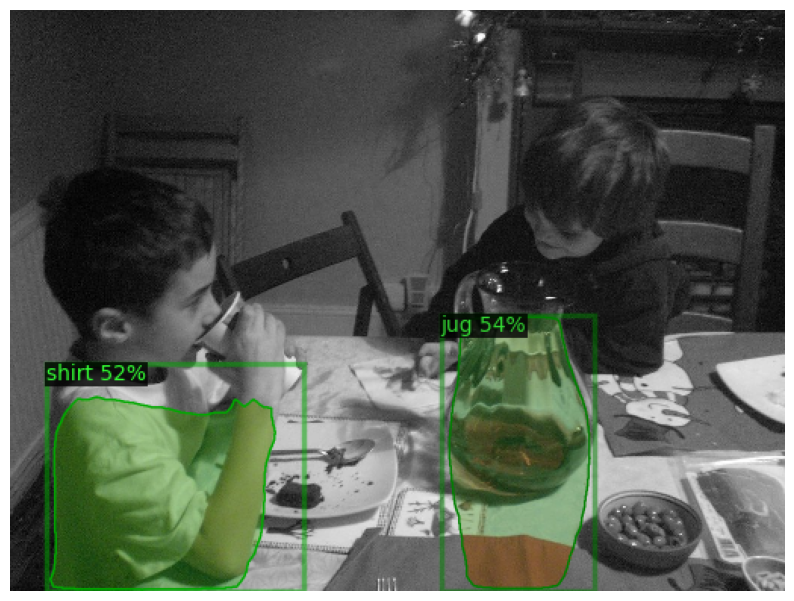

[12/29/24 07:50:01] INFO     Chose `train/myData2020/90990e6beb415ffc.jpg` from input                                                                   ]8;id=807056;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=173992;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

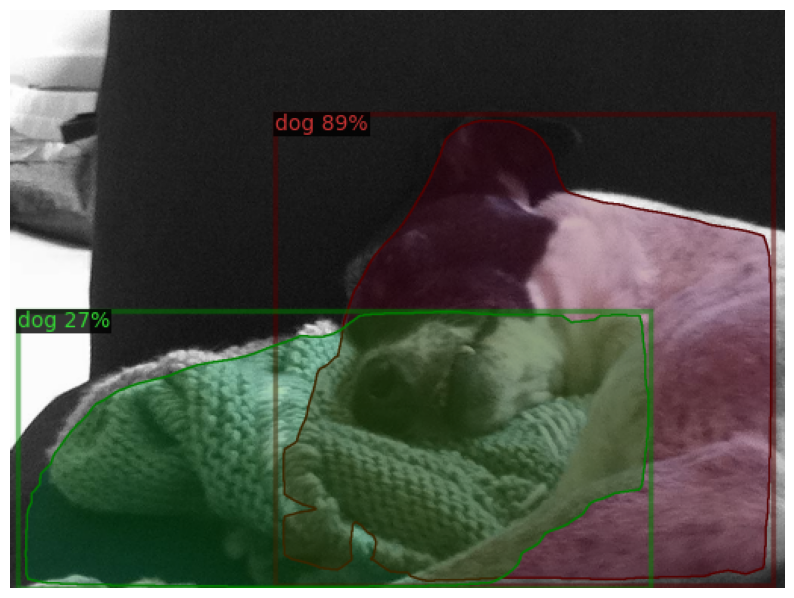

[12/29/24 07:50:02] INFO     Chose `train/myData2020/37b21e5b51828111.jpg` from input                                                                   ]8;id=489749;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=133503;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

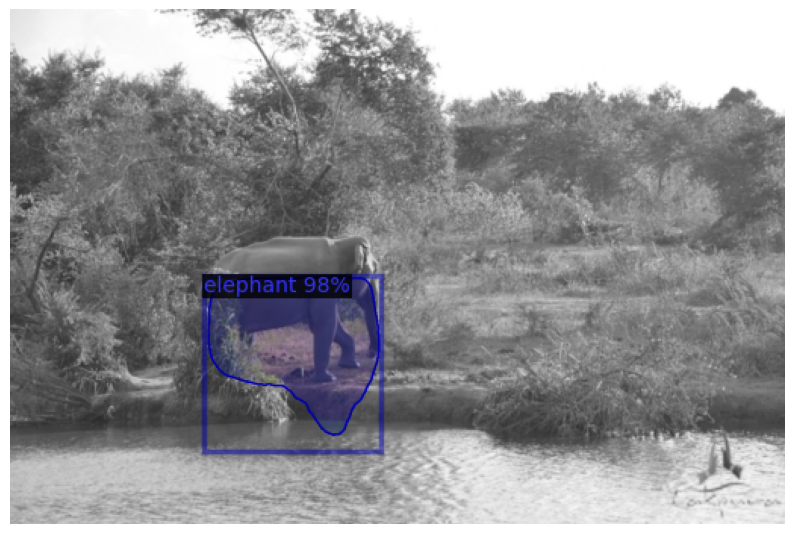

[12/29/24 07:50:03] INFO     Chose `train/myData2020/10e4c993dd9adbe3.jpg` from input                                                                   ]8;id=574942;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=151348;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

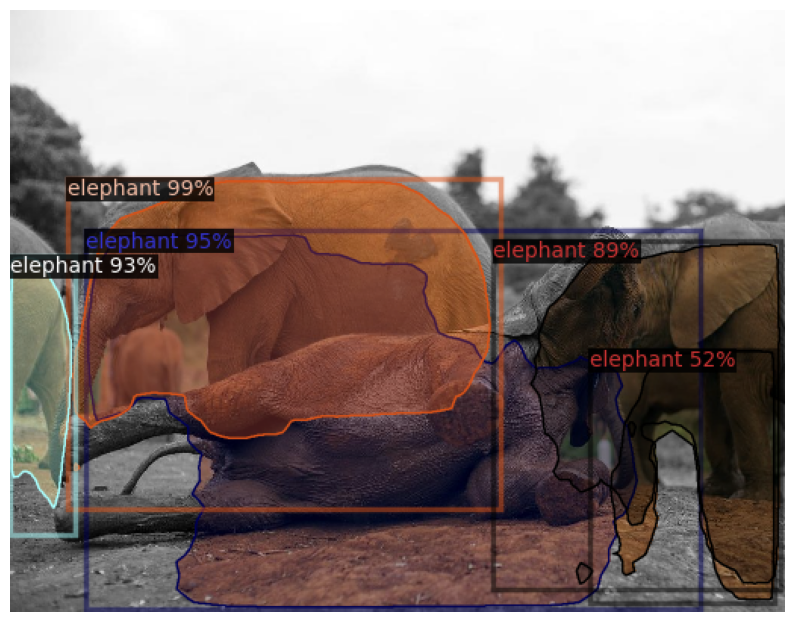

                    INFO     Chose `train/myData2020/58e50dd99e332025.jpg` from input                                                                   ]8;id=803348;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=111422;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

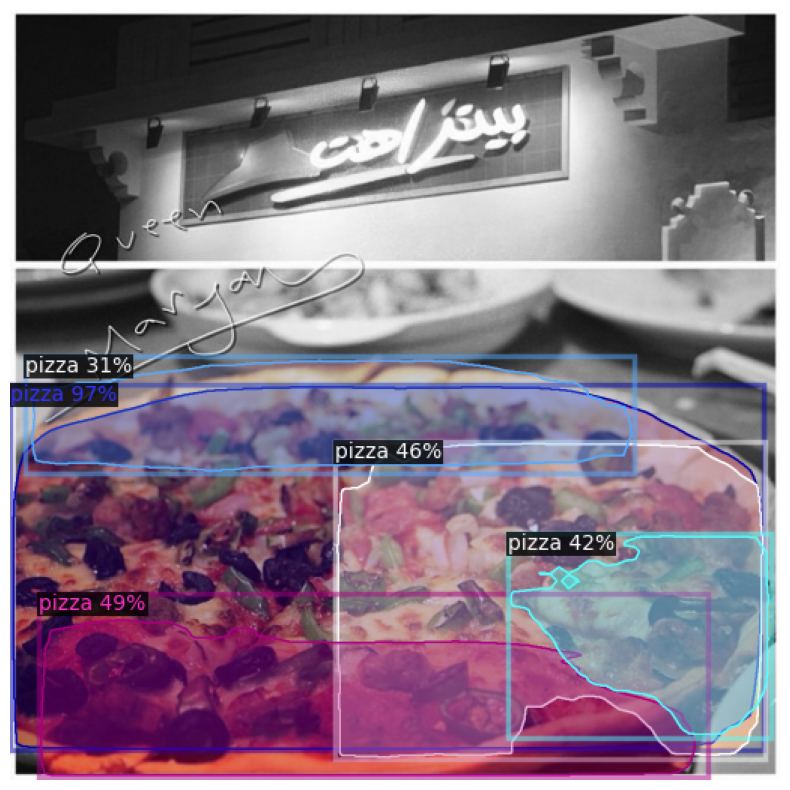

[12/29/24 07:50:05] INFO     Chose `train/myData2020/99aef1f9c1c640d4.jpg` from input                                                                   ]8;id=511864;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187\loader.py]8;;\:]8;id=900525;file:///usr/local/lib/python3.10/dist-packages/torch_snippets/loader.py:187#choose:187\choose:187]8;;\

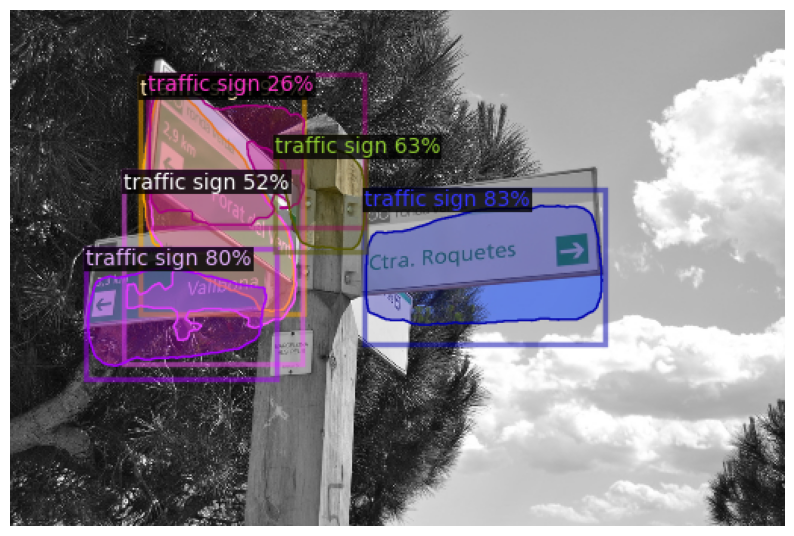

In [14]:
!pip install opencv-python-headless
import cv2

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "trained_model.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.25
predictor = DefaultPredictor(cfg)
from detectron2.utils.visualizer import ColorMode
files = Glob('train/myData2020')
for _ in range(30):
    im = cv2.imread(choose(files))
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                    scale=0.5,
                    metadata=MetadataCatalog.get("dataset_train"),
                    instance_mode=ColorMode.IMAGE_BW
# remove the colors of unsegmented pixels.
# This option is only available for segmentation models
    )

    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    show(out.get_image())